In [1]:
import pandas as pd
from urllib.request import urlopen
from geopy.geocoders import Nominatim
import requests
from pandas.io.json import json_normalize
import folium
import numpy as np
from sklearn.cluster import KMeans
import matplotlib.cm as cm
import matplotlib.colors as colors
import warnings


#Hyperparameters & Variables
RADIUS = 1500
VENUE_LIMIT = 30
NUM_TOP_VENUES_TO_CONSIDER = 10
KCLUSTERS = 5
ImportfromCSV = True
warnings.filterwarnings('ignore')
#pd.options.display.max_rows = 2000

## Read in CSV of U.S. Secondary Schools & Display Map

In [2]:
df_usschools_original = pd.read_csv('US University Geocode.csv')
df_usschools = df_usschools_original[['NAME','CITY','STATE','LAT','LON',]]
df_usschools

#highlight whole cell then Ctrl + '/'' to comment or uncommment whole cell
latitude = 37.0902
longitude = -95.7129
map_usuniversities = folium.Map(location=[latitude, longitude], zoom_start=3,max_bounds=True,prefer_canvas=True, min_zoom=2)

# markers_colors = []
# for lat, lon, university in zip(df_usschools['LAT'], df_usschools['LON'], df_usschools['NAME']):
#     label = folium.Popup(str(university), parse_html=True)
#     folium.Circle(
#         [lat, lon],
#         radius=5,
#         popup=label,
#         fill=True,
#         fill_opacity=0.7).add_to(map_usuniversities)
markers_colors = []
for lat, lon, university in zip(df_usschools['LAT'], df_usschools['LON'], df_usschools['NAME']):
    label = folium.Popup(str(university), parse_html=True)
    folium.Circle(
        [lat, lon],
        popup=label).add_to(map_usuniversities)
map_usuniversities

## Downsize University Data to IN, IL, MI, OH to work with Foursquare API limitations

In [4]:
df_midwest = df_usschools[df_usschools['STATE'].str.contains("MI") | df_usschools['STATE'].str.contains("OH") | df_usschools['STATE'].str.contains("IL")| df_usschools['STATE'].str.contains("IN")]
#df_midwest = df_usschools[df_usschools['STATE'].str.contains("IN")]

#added in drop - may change results and need to verify
df_midwest.reset_index(drop=True)
#df_midwest.reset_index()

sb_lat = 41.6764
sb_lon = -86.2520
map_midwestuniversities = folium.Map(location=[sb_lat, sb_lon], zoom_start=6,max_bounds=True,prefer_canvas=True, min_zoom=2)

markers_colors = []
for sb_lat, sb_lon, university in zip(df_midwest['LAT'], df_midwest['LON'], df_midwest['NAME']):
    label = folium.Popup(str(university), parse_html=True)
    folium.Circle(
        [sb_lat, sb_lon],
        radius=5,
        popup=label).add_to(map_midwestuniversities)
    
map_midwestuniversities.save('map_midwestuniversities.html')
map_midwestuniversities

## Define Foursquare functions and credentials

In [5]:
CLIENT_ID = 'AJJHZCAKBBVZY333EVXDYLDO3ZXKVRDJHVJ3MOYFUSRTO1BZ' # your Foursquare ID
CLIENT_SECRET = 'PENS13MAMVLSKPHOOCA1E5I0RALVGVOESKDEQU3U05YEEIQZ' # your Foursquare Secret
VERSION = '20180604'

print('Your credentails:')
print('CLIENT_ID: ' + CLIENT_ID)
print('CLIENT_SECRET:' + CLIENT_SECRET)

def getNearbyVenues(names, latitudes, longitudes):
    LIMIT = VENUE_LIMIT
    radius = RADIUS
    venues_list=[]
    for name, lat, lng in zip(names, latitudes, longitudes):
        #print(name)
        
        url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
    CLIENT_ID, 
    CLIENT_SECRET, 
    VERSION, 
    lat, 
    lng, 
    RADIUS, 
    LIMIT)
        # make the GET request
        try:
            results = requests.get(url, verify=False).json()["response"]['groups'][0]['items']
             # return only relevant information for each nearby venue
            venues_list.append([(
                name, 
                lat, 
                lng, 
                v['venue']['name'], 
                v['venue']['location']['lat'], 
                v['venue']['location']['lng'],  
                v['venue']['categories'][0]['name']) for v in results])

            nearby_venues = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
            nearby_venues.columns = ['School', 
                  'School Latitude', 
                  'School Longitude', 
                  'Venue', 
                  'Venue Latitude', 
                  'Venue Longitude', 
                  'Venue Category']
            print("Success ",name, "Lat ",lat, "Long ",lng)
        except:
            print("Bad Result for ",name, "Lat ",lat, "Long ",lng)
       
    
    return(nearby_venues)

Your credentails:
CLIENT_ID: AJJHZCAKBBVZY333EVXDYLDO3ZXKVRDJHVJ3MOYFUSRTO1BZ
CLIENT_SECRET:PENS13MAMVLSKPHOOCA1E5I0RALVGVOESKDEQU3U05YEEIQZ


## Call Foursquare API or use previous results from a saved CSV
This is due to there being a lot of Universities and exceeding the daily allotment for API calls on the free license

In [6]:
#Import from either a CSV saved from FourSquare or go to Foursquare
if ImportfromCSV:
    df_IN_venues = pd.read_csv('venues.csv',names=['School', 
                  'School Latitude', 
                  'School Longitude', 
                  'Venue', 
                  'Venue Latitude', 
                  'Venue Longitude', 
                  'Venue Category'])
else:
    df_IN_venues = getNearbyVenues(names=df_midwest['NAME'],
                                   latitudes=df_midwest['LAT'],
                                   longitudes=df_midwest['LON']
                                  )
    df_IN_venues.to_csv('venues.csv', mode='a', header=False)
    
df_IN_venues.reset_index(drop=True)

,School,School Latitude,School Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,Flashpoint Chicago A Campus of Columbia Colleg...,41.882848,-87.631154,Cadillac Palace Theatre,41.884006,-87.633144,Theater
1,Flashpoint Chicago A Campus of Columbia Colleg...,41.882848,-87.631154,Kimpton Gray Hotel,41.880875,-87.631752,Hotel
2,Flashpoint Chicago A Campus of Columbia Colleg...,41.882848,-87.631154,Do-Rite Donuts & Coffee,41.884598,-87.629904,Donut Shop
3,Flashpoint Chicago A Campus of Columbia Colleg...,41.882848,-87.631154,James M. Nederlander Theatre,41.884416,-87.628861,Theater
4,Flashpoint Chicago A Campus of Columbia Colleg...,41.882848,-87.631154,Pret A Manger,41.883872,-87.628652,Sandwich Place
...,...,...,...,...,...,...,...
33400,Baker College - Flint,42.975177,-83.697246,SUBWAY,42.987833,-83.693476,Sandwich Place
33401,Baker College - Flint,42.975177,-83.697246,Family Dollar,42.974989,-83.686306,Discount Store
33402,Baker College - Flint,42.975177,-83.697246,Wendy’s,42.973554,-83.684777,Fast Food Restaurant
33403,Baker College - Flint,42.975177,-83.697246,Capitol,42.973321,-83.712547,Diner


## One hot encoding of data, grouping by most frequent venues, view top 10

In [7]:
IN_onehot = pd.get_dummies(df_IN_venues[['Venue Category']],prefix="",prefix_sep="")
IN_onehot['School']=df_IN_venues['School']
fixed_columns = [IN_onehot.columns[-1]] + list(IN_onehot.columns[:-1])
IN_onehot = IN_onehot[fixed_columns]

IN_univ_venues_grouped = IN_onehot.groupby('School').mean().reset_index()

def return_most_common_venues(row, num_top_venues):
    row_categories = row.iloc[1:]
    row_categories_sorted = row_categories.sort_values(ascending=False)
    
    return row_categories_sorted.index.values[0:num_top_venues]


num_top_venues = NUM_TOP_VENUES_TO_CONSIDER

indicators = ['st', 'nd', 'rd']

# create columns according to number of top venues
columns = ['School']
for ind in np.arange(num_top_venues):
    try:
        columns.append('{}{} Most Common Venue'.format(ind+1, indicators[ind]))
    except:
        columns.append('{}th Most Common Venue'.format(ind+1))

# create a new dataframe
IN_venues_sorted = pd.DataFrame(columns=columns)
IN_venues_sorted['School'] = IN_univ_venues_grouped['School']

for ind in np.arange(IN_univ_venues_grouped.shape[0]):
    IN_venues_sorted.iloc[ind, 1:] = return_most_common_venues(IN_univ_venues_grouped.iloc[ind, :], num_top_venues)

IN_venues_sorted

,School,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,ATA College - Cincinnati,Clothing Store,Gas Station,Mexican Restaurant,Supplement Shop,American Restaurant,Sandwich Place,Gym / Fitness Center,Pet Store,Restaurant,Discount Store
1,Abcott Institute,Fast Food Restaurant,Sandwich Place,Cosmetics Shop,Grocery Store,Coffee Shop,Gym / Fitness Center,BBQ Joint,Bank,Bar,Gas Station
2,Adler University,Hotel,Theater,Coffee Shop,Middle Eastern Restaurant,Gastropub,Salad Place,Donut Shop,Arts & Crafts Store,Sandwich Place,Fountain
3,Adrian College,Pizza Place,Café,Hotel,Discount Store,Optical Shop,Sandwich Place,Video Store,Fast Food Restaurant,Gym / Fitness Center,Gas Station
4,Adult and Community Education-Hudson,Discount Store,History Museum,Public Art,Food Court,Fast Food Restaurant,Soccer Stadium,Caribbean Restaurant,Gas Station,Chinese Restaurant,Park
...,...,...,...,...,...,...,...,...,...,...,...
886,Wright State University-Main Campus,Mexican Restaurant,Coffee Shop,Café,Sandwich Place,Pizza Place,Steakhouse,Kebab Restaurant,Burger Joint,Breakfast Spot,Smoke Shop
887,Xavier University,Pizza Place,Ice Cream Shop,Discount Store,Bar,High School,Home Service,Bowling Alley,College Basketball Court,Sandwich Place,Breakfast Spot
888,Yeshiva Gedolah of Greater Detroit,Donut Shop,Cosmetics Shop,Middle Eastern Restaurant,Deli / Bodega,Pharmacy,Shipping Store,Steakhouse,Bookstore,Mobile Phone Shop,Burger Joint
889,Youngstown State University,Coffee Shop,Sandwich Place,Cocktail Bar,Bar,Fast Food Restaurant,Italian Restaurant,Rental Car Location,Science Museum,Bakery,Performing Arts Venue


# Clustering Universities using K-Means

In [10]:
IN_grouped_clustering = IN_univ_venues_grouped.drop('School', 1)
sum_of_squared_distances = []
#Loop through entire list of universities, captured by the shape[0] command
#K = range(1,IN_univ_venues_grouped.shape[0])

#Limiting the number of loops to save processing time
K = range(1,50)
for k in K:
    print(k, end = ' ')
    km = KMeans(n_clusters = k)
    km = km.fit(IN_grouped_clustering)
    sum_of_squared_distances.append(km.inertia_)

1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47 48 49 

## Display sum of squared distances for various Ks and use elbow method
Elbow method looks for where the increase in K begins to offer less value

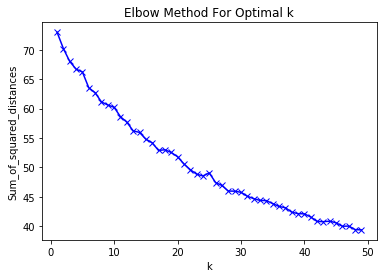

In [11]:
import matplotlib.pyplot as plt
plt.plot(K, sum_of_squared_distances, 'bx-')
plt.xlabel('k')
plt.ylabel('Sum_of_squared_distances')
plt.title('Elbow Method For Optimal k')
plt.show()

## Using optimal K based off of elbow method

In [13]:
kclusters = 30

IN_grouped_clustering = IN_univ_venues_grouped.drop('School', 1)

# run k-means clustering
#need to define n_init=10, max_iter = 300
kmeans = KMeans(n_clusters=kclusters, random_state=0,n_init=10).fit(IN_grouped_clustering)


## Merged dataframes to display University with 10 ten venues

In [15]:
IN_venues_sorted.insert(0, 'Cluster Labels', kmeans.labels_)
IN_merged = df_midwest
IN_merged = IN_merged.join(IN_venues_sorted.set_index('School'), on='NAME')
pd.options.display.max_rows = 1000
IN_merged = IN_merged.dropna()
IN_merged.reset_index(drop=True)

ValueError: cannot insert Cluster Labels, already exists

In [51]:
IN_merged.sort_values(by=['NAME'], ascending=True)

,NAME,CITY,STATE,LAT,LON,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
5603,ATA College - Cincinnati,Cincinnati,OH,39.296710,-84.478867,22.0,Clothing Store,Gas Station,Mexican Restaurant,Supplement Shop,American Restaurant,Sandwich Place,Gym / Fitness Center,Pet Store,Restaurant,Discount Store
6051,Abcott Institute,Southfield,MI,42.446331,-83.210617,0.0,Fast Food Restaurant,Sandwich Place,Cosmetics Shop,Grocery Store,Coffee Shop,Gym / Fitness Center,BBQ Joint,Bank,Bar,Gas Station
983,Adler University,Chicago,IL,41.882414,-87.629156,16.0,Hotel,Theater,Coffee Shop,Middle Eastern Restaurant,Gastropub,Salad Place,Donut Shop,Arts & Crafts Store,Sandwich Place,Fountain
1731,Adrian College,Adrian,MI,41.898591,-84.061481,11.0,Pizza Place,Café,Hotel,Discount Store,Optical Shop,Sandwich Place,Video Store,Fast Food Restaurant,Gym / Fitness Center,Gas Station
2896,Adult and Community Education-Hudson,Columbus,OH,40.012851,-82.980603,8.0,Discount Store,History Museum,Public Art,Food Court,Fast Food Restaurant,Soccer Stadium,Caribbean Restaurant,Gas Station,Chinese Restaurant,Park
2828,Air Force Institute of Technology-Graduate Sch...,Wright-Patterson AFB,OH,39.782221,-84.082618,5.0,Bar,Sandwich Place,Mexican Restaurant,Salon / Barbershop,Hotel,Historic Site,Fast Food Restaurant,History Museum,Coffee Shop,Chinese Restaurant
1732,Albion College,Albion,MI,42.245049,-84.745639,4.0,Pizza Place,Gas Station,Bookstore,Train Station,Discount Store,Disc Golf,Pharmacy,Bar,Brewery,Sandwich Place
4428,Alexandria School of Scientific Therapeutics,Alexandria,IN,40.255608,-85.674016,19.0,Bar,Pizza Place,Music Store,Music Venue,Golf Course,Bank,Pharmacy,Discount Store,Diner,Food
4442,Alliance Career Center,Alliance,OH,40.911271,-81.111225,27.0,Discount Store,Bank,Pizza Place,American Restaurant,Bar,Pharmacy,Diner,Sandwich Place,Grocery Store,Convenience Store
5991,Allstate Hairstyling & Barber College,Cleveland,OH,41.484002,-81.704403,2.0,Coffee Shop,French Restaurant,Market,Brewery,Beer Bar,Cocktail Bar,New American Restaurant,Southern / Soul Food Restaurant,Café,Burrito Place


## Group universities into their clusters and view total universities in each cluster

In [52]:
IN_Summerized = IN_merged.groupby('Cluster Labels').count().sort_values(by='NAME',ascending=False)
#IN_Summerized[IN_Summerized['NAME'] > 1]

Viewing by size of cluster

In [49]:
#len(IN_Summerized['NAME'])
#for i in IN_Summerized.index.values.tolist():
for i in list(IN_Summerized.index.values):
    print ('*****Universities in cluster', i,'*****')
    print(IN_merged.loc[IN_merged['Cluster Labels'] == i, IN_merged.columns[[0]]].to_string(index=False))

*****Universities in cluster 27.0 *****
                                                      NAME
                                         Augustana College
                              Bethany Theological Seminary
         Blessing Hospital School of Radiologic Technology
                         Empire Beauty School-Hanover Park
                La James International College-East Moline
                                 Cosmetology & Spa Academy
                                   Elgin Community College
                                            Eureka College
                           First Institute of Travel, Inc.
                         Graham Hospital School of Nursing
                  Hair Professionals School of Cosmetology
                               Lakeview College of Nursing
                                           Lincoln College
              Trinity College of Nursing & Health Sciences
                                         MacMurray College
                

Viewing clusters from 1 to n

In [55]:
for i in range(0,30):
    print ('*****Universities in cluster', i,'*****')
    print(IN_merged.loc[IN_merged['Cluster Labels'] == i, IN_merged.columns[[0]]].to_string(index=False))

*****Universities in cluster 0 *****
                                            NAME
                   Southwestern Illinois College
                               Blackburn College
                        Chicago State University
   City Colleges of Chicago-Kennedy-King College
                            John A Logan College
               Lewis and Clark Community College
                           Prairie State College
       Southern Illinois University-Edwardsville
                                 Hanover College
     PJ's College of Cosmetology- Jeffersonville
                           Huntington University
               Ivy Tech Community College-Kokomo
             Ivy Tech Community College-Richmond
                         Indiana University-East
                      Ravenscroft Beauty College
         PJ's College of Cosmetology- Greenfield
             PJ's College of Cosmetology- Muncie
                        Baker College of Jackson
                      Kirtland C

           Lil Lou's Beauty and Barber College-Hammond
*****Universities in cluster 23 *****
          NAME
 Hiram College
*****Universities in cluster 24 *****
                                                           NAME
                                Danville Area Community College
                                              Lake Land College
                                   Lincoln Christian University
                                 Lincoln Land Community College
                                              Rend Lake College
                       St. John's College-Department of Nursing
                          University of Illinois at Springfield
                                               Trine University
                              Davenport University - Wayne CCCD
                              Michigan Technological University
                                   University of Michigan-Flint
                                   Northern Michigan University
       

## Map of  clustered universities

In [53]:
# create map
import matplotlib.cm as cm
import matplotlib.colors as colors

map_clusters = folium.Map(location=[sb_lat, sb_lon], zoom_start=6)

# set color scheme for the clusters
x = np.arange(kclusters)
ys = [i + x + (i*x)**2 for i in range(kclusters)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

# add markers to the map
markers_colors = []
for lat, lon, poi, cluster in zip(IN_merged['LAT'], IN_merged['LON'], IN_merged['NAME'], IN_merged['Cluster Labels']):
    label = folium.Popup(str(poi) + ' Cluster ' + str(cluster), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        popup=label,
        color=rainbow[int(cluster)-1],
        fill=True,
        fill_color=rainbow[int(cluster)-1],
        fill_opacity=0.7).add_to(map_clusters)
       
map_clusters

In [56]:
# create map
import matplotlib.cm as cm
import matplotlib.colors as colors

map_clusters = folium.Map(location=[sb_lat, sb_lon], zoom_start=6)

# set color scheme for the clusters
x = np.arange(kclusters)
ys = [i + x + (i*x)**2 for i in range(kclusters)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

# add markers to the map
markers_colors = []
for lat, lon, poi, cluster in zip(IN_merged['LAT'], IN_merged['LON'], IN_merged['NAME'], IN_merged['Cluster Labels']):
    label = folium.Popup(str(poi) + ' Cluster ' + str(cluster), parse_html=True)
    if cluster == 2:
        folium.CircleMarker(
        [lat, lon],
        radius=5,
        popup=label,
        color=rainbow[int(cluster)-1],
        fill=True,
        fill_color=rainbow[int(cluster)-1],
        fill_opacity=0.7).add_to(map_clusters)
       
map_clusters